# Activity 2.3 Bias-Variance in Regression
In this activity we practice the bias-variance analysis in the linear regression setting. In Assessment 2, you will be asked to perform bias-variance analysis for Ridge regression.

## Data
Let's start with generating a synthetic data set. To do so, we generate a one dimensional variable `x` with uniformly scattered values in range `[-0.3, 0.3]`.

In [1]:
x = (-300:300)/1000 # 1-dimensional points
N = length(x)      # number of points

Now, we need two auxiliary functions `f` and `g` to generate labels based on the true model and the observed labels (which are the true label plus some gaussian additive noises). Note that the regressor does not aware of the true model `f` and only observe `g` outputs. In the followings, `h` and `sd` are the observed labels and the standard deviation of the added noise, respectively.

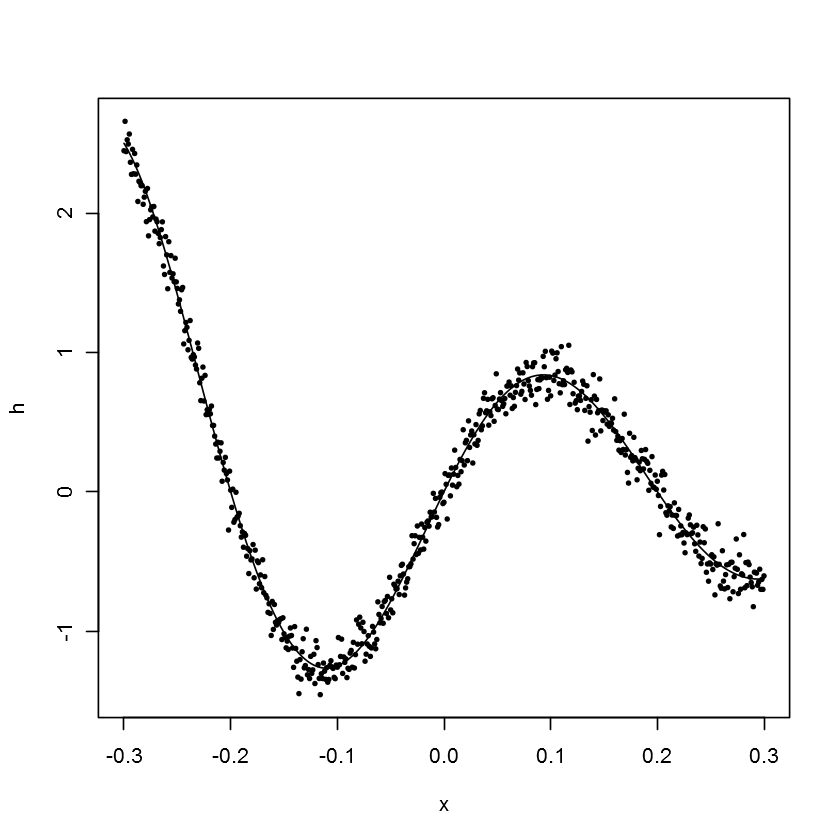

In [2]:
f <- function(x) sin(5*pi*x)/(1+2*x)   
g <- function(x, sd=0.01) f(x) + rnorm(length(x),sd=sd)
h = g(x, sd=0.1)
plot(x, h, pch = 16, col='black', cex=.5); lines(x,f(x))

To have models with different degrees of complexity, we expand the feature space (the 1-dimensional `x`) by simply computing higher degree polynomials of `x` values. Function `poly` helps us to compute these values. Each column of `X` corresponds to one of these dimensions.

In [3]:
poly <- function(x, m=1){
    X = as.data.frame(matrix(1, nrow=N, ncol=1))
    names(X) <- 'x0'
    if (m<2) return (X)
    for (i in 1:m){
        x.i <- as.data.frame(x^i)
        names(x.i) <- paste('x',i, sep='')
        X = cbind(X, x.i)
    }
    return (X)
}
X <- cbind(f=f(x), g=h, poly(x, 20))
head(X)

,f,g,x0,x1,x2,x3,x4,x5,x6,x7,...,x11,x12,x13,x14,x15,x16,x17,x18,x19,x20
1,2.5,2.44687258819054,1,-0.3,0.09,-0.027,0.0081,-0.00243,0.000729,-0.0002187,...,-1.77147e-06,5.31441e-07,-1.594323e-07,4.782969e-08,-1.4348907e-08,4.3046721e-09,-1.29140163e-09,3.87420489e-10,-1.162261467e-10,3.486784401e-11
2,2.48725530468075,2.65786111330487,1,-0.299,0.089401,-0.026730899,0.007992538801,-0.002389769101499,0.000714540961348201,-0.000213647747443112,...,-1.70758791118532e-06,5.10568785444411e-07,-1.52660066847879e-07,4.56453599875158e-08,-1.36479626362672e-08,4.0807408282439e-09,-1.22014150764493e-09,3.64822310785833e-10,-1.09081870924964e-10,3.26154794065642e-11
3,2.47402613951914,2.44079050982858,1,-0.298,0.088804,-0.026463592,0.007886150416,-0.002350072823968,0.000700321701542464,-0.000208695867059654,...,-1.64580699882997e-06,4.90450485651332e-07,-1.46154244724097e-07,4.35539649277809e-08,-1.29790815484787e-08,3.86776630144665e-09,-1.1525943578311e-09,3.43473118633668e-10,-1.02354989352833e-10,3.05017868271443e-11
4,2.46031988906889,2.52539304894734,1,-0.297,0.088209,-0.026198073,0.007780827681,-0.002310905821257,0.000686339028913329,-0.000203842691587259,...,-1.58606485727169e-06,4.71061262609691e-07,-1.39905194995078e-07,4.15518429135383e-08,-1.23408973453209e-08,3.6652465115603e-09,-1.08857821393341e-09,3.23307729538222e-10,-9.6022395672852e-11,2.8518651514837e-11
5,2.44614394222616,2.49506302732626,1,-0.296,0.087616,-0.025934336,0.007676563456,-0.002272262782976,0.000672589783760896,-0.000199086575993225,...,-1.52830073384976e-06,4.52377017219528e-07,-1.3390359709698e-07,3.96354647407062e-08,-1.1732097563249e-08,3.47270087872171e-09,-1.02791946010163e-09,3.04264160190082e-10,-9.00621914162641e-11,2.66584086592142e-11
6,2.43150569203202,2.56660843516114,1,-0.295,0.087025,-0.025672375,0.007573350625,-0.002234138434375,0.000659070838140625,-0.000194425897251484,...,-1.47245549046571e-06,4.34374369687386e-07,-1.28140439057779e-07,3.78014295220447e-08,-1.11514217090032e-08,3.28966940415594e-09,-9.70452474226003e-10,2.86283479896671e-10,-8.44536265695179e-11,2.49138198380078e-11


## Model Fitting and Visualization
Now, we try to fit several models with different degrees of complexity, and compare them against the true model `f` and the observations `y` (produced by `g(.)`). Note that we build a few models for each degree of complexity to have a population of errors instead of only one sample. This will help us to study the uncertainty in the prediction and perform the bias-variance analysis. Indeed the statement `indx <- sort(sample(1:N, subset.size, replace = TRUE))` in the inner loop works as a bootstrap sampler where `subset.size` is the size of the selected samples (note that we sort the index only for the visualization purpose).

For this part, we use a simple but fast implementation of linear regression `lm`. In the followings, `m` corresponds to model complexity (or more percisely the degree of the polynomial).

The following code procudes one plot for each model complexity. The black line in the plots indicates the true (generative) model `f`, while each red line belongs to a model that is trained using the selected samples. The blue lines in each graph correspond to the average of the prediction obtained by the trained models (while the model complexity is fixed).

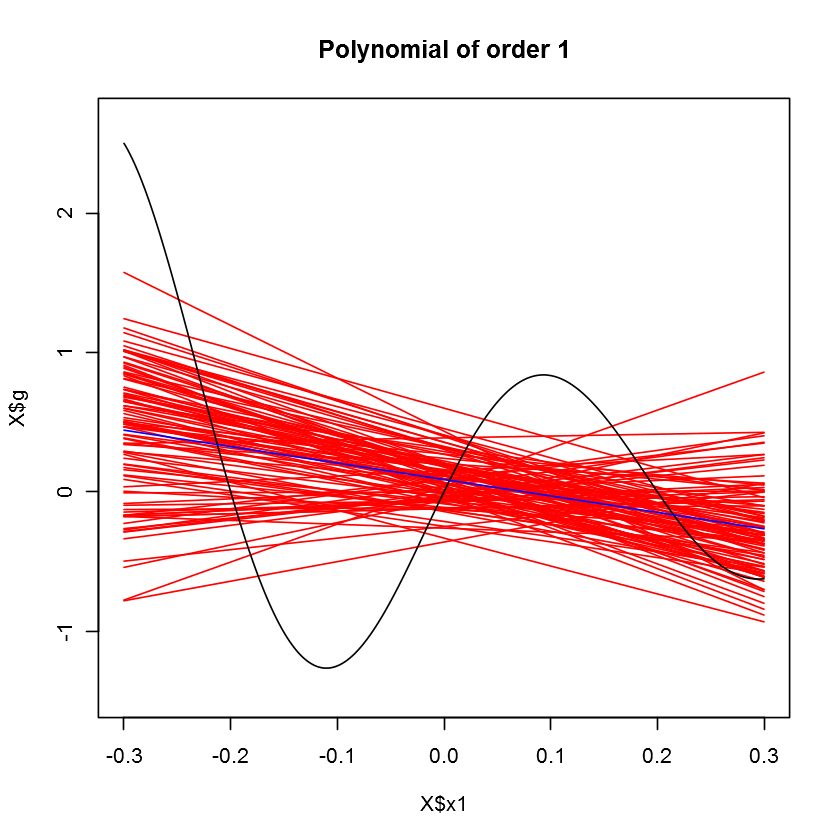

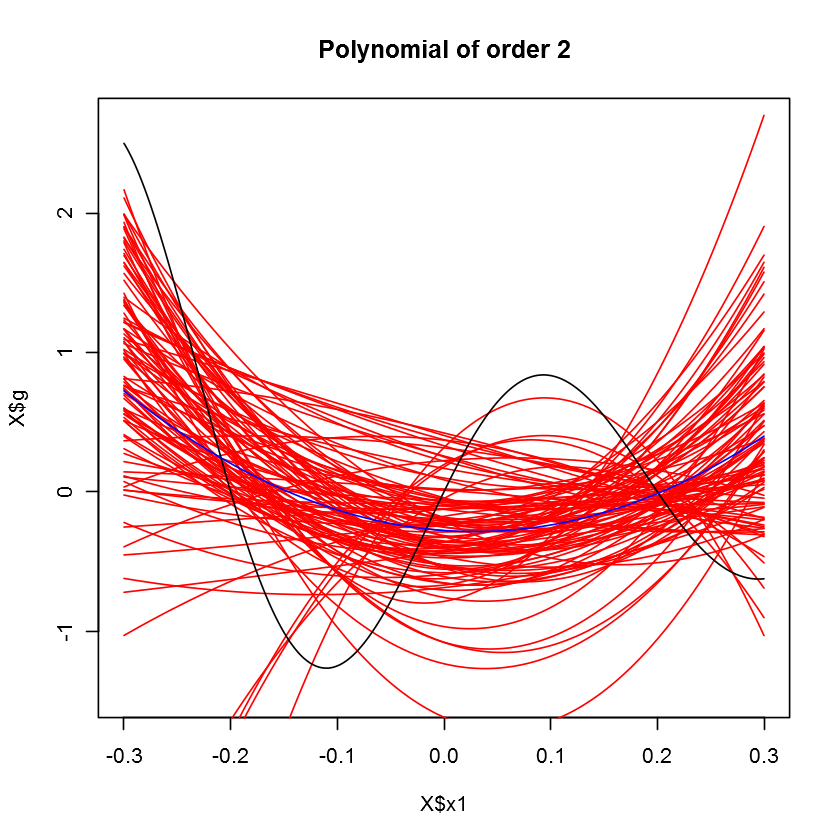

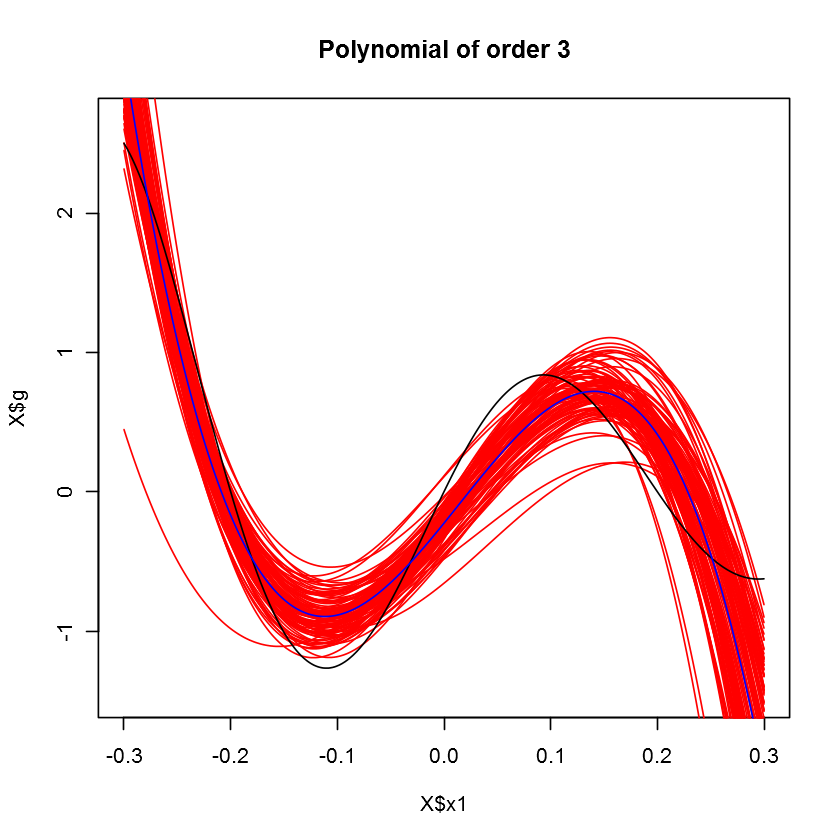

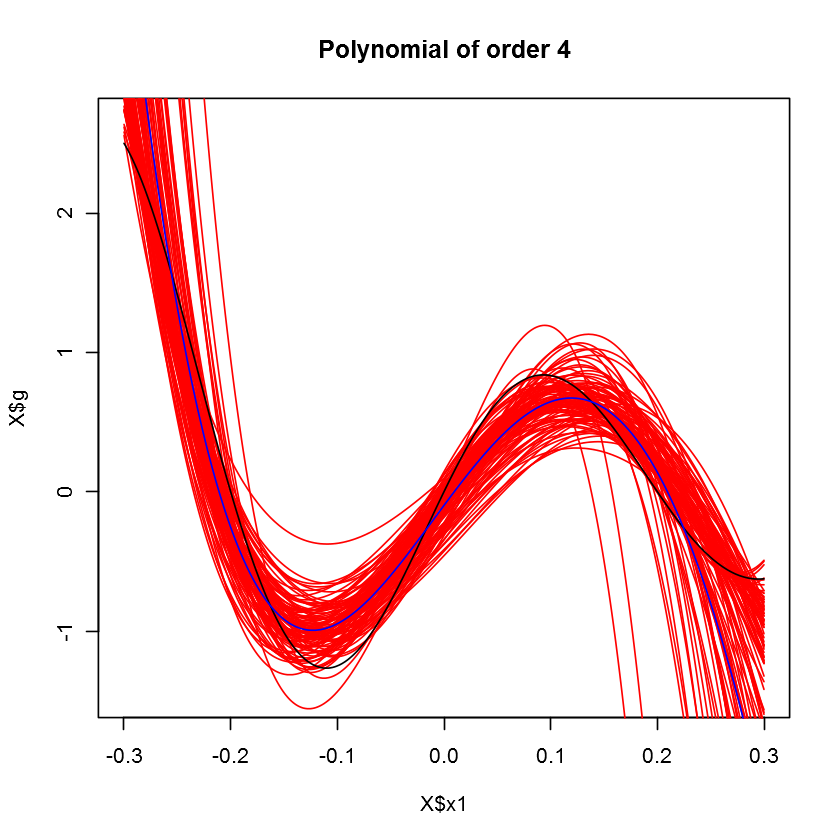

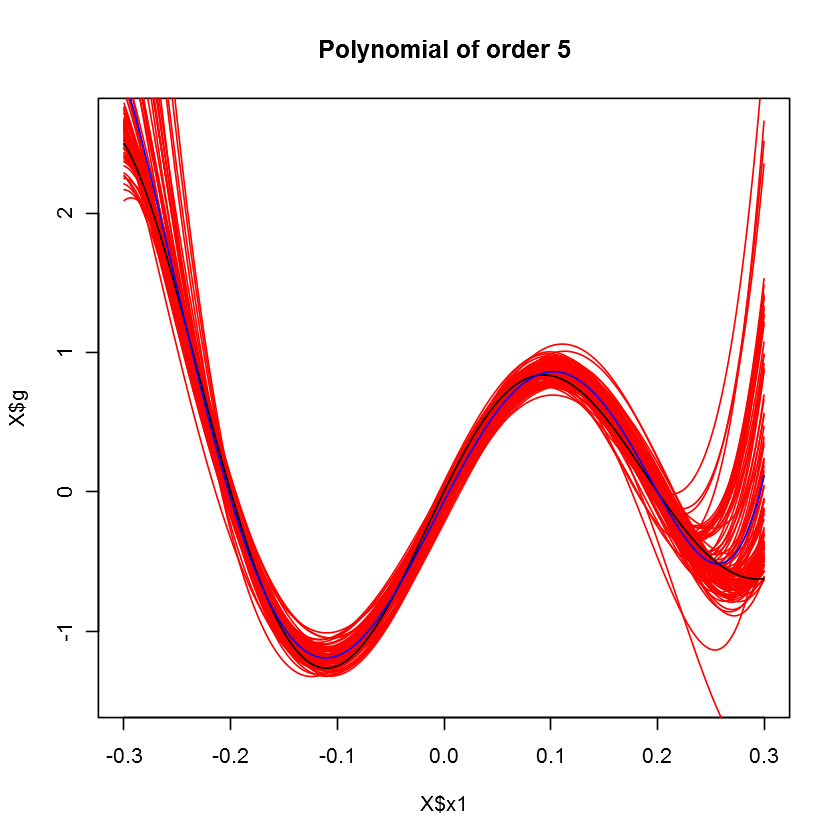

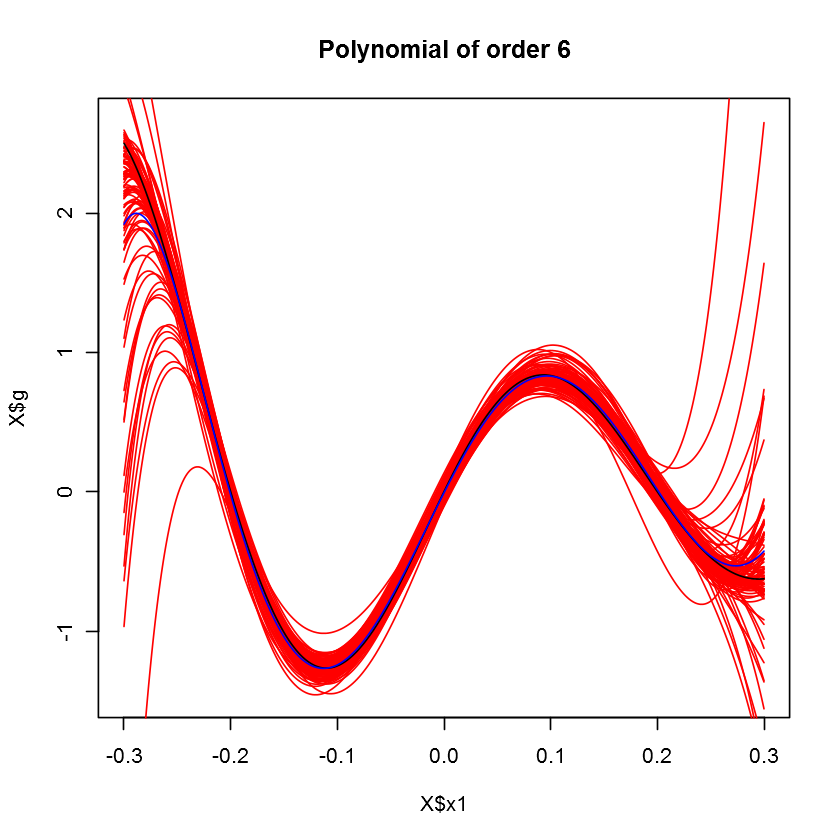

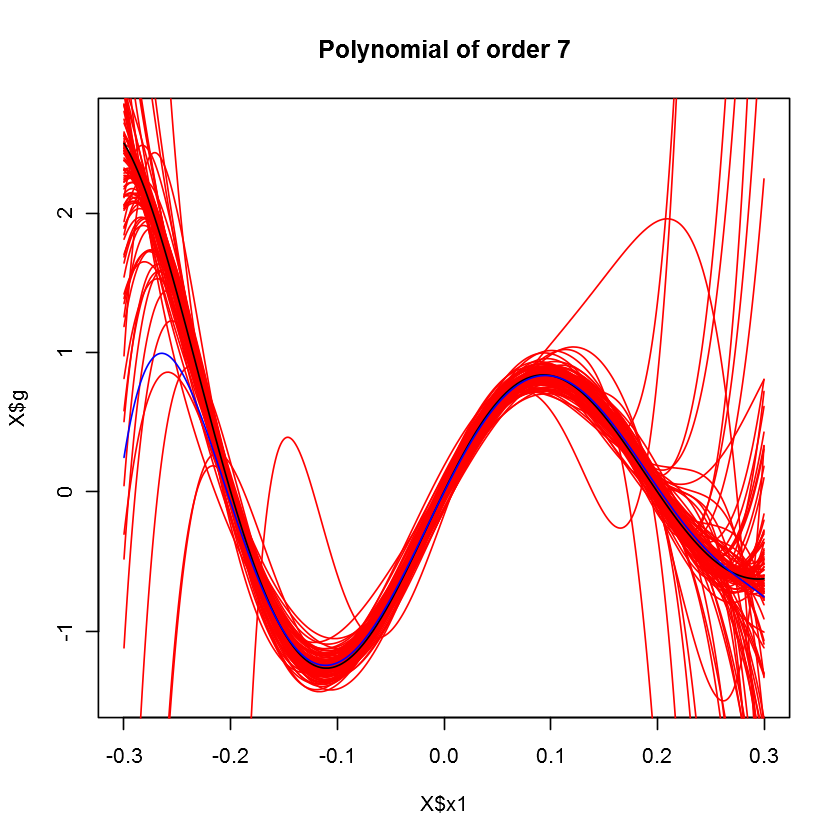

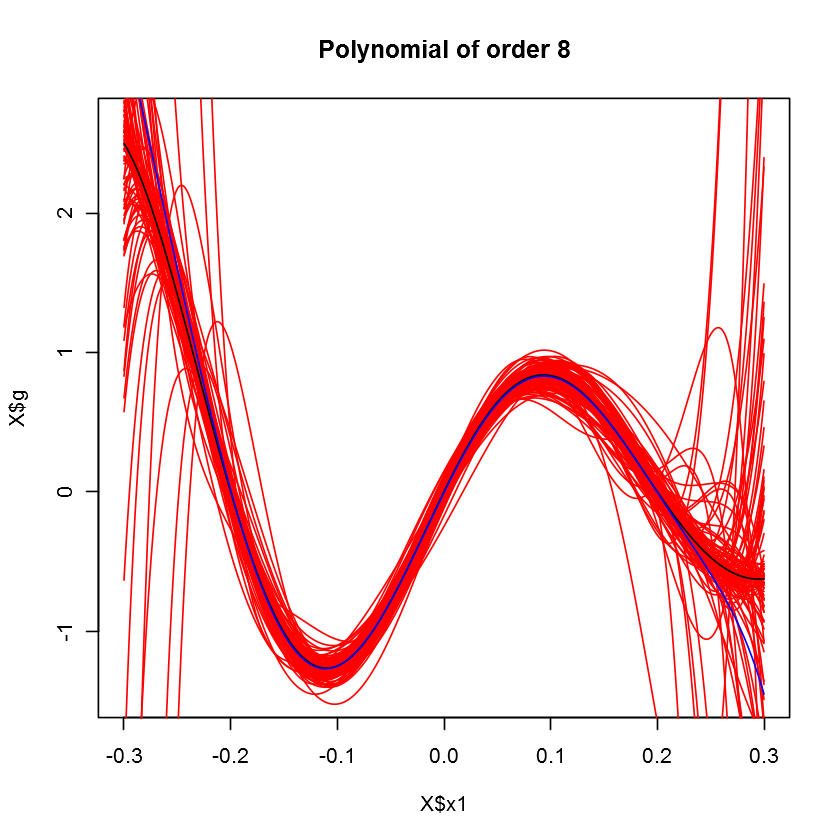

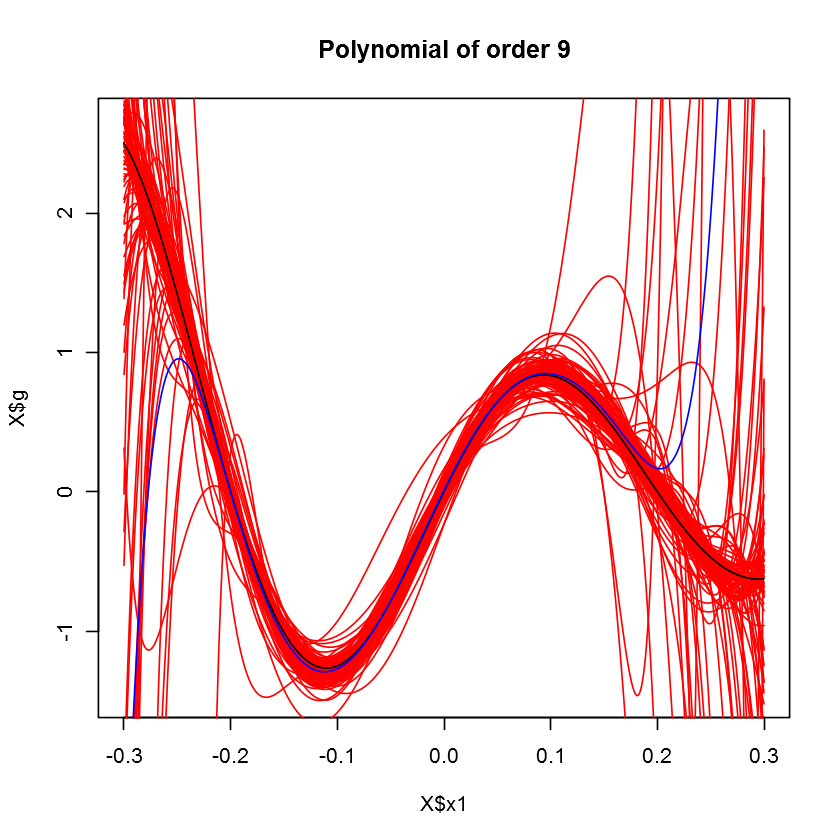

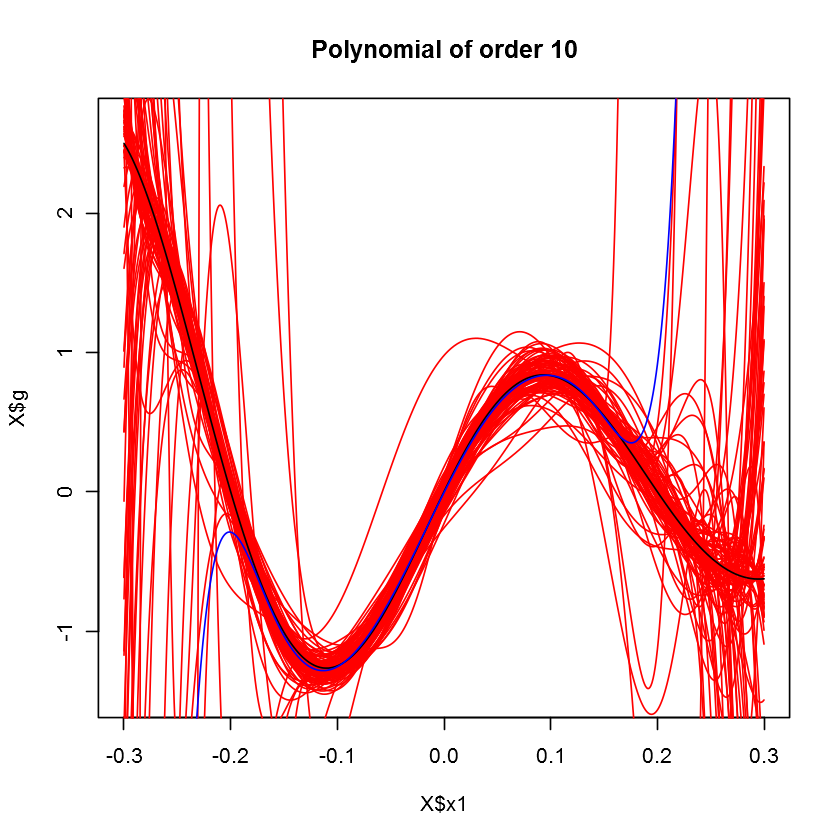

In [4]:
# trun warnings off! (warnings are produced when the sampled training data does not cover the space well...
#(known as Rank Deficiency))
options(warn=-1)

# set sample size to 50 and repeat the number of bootsrapping to 20
subset.size = 20
subset.num = 100

# for each degree of polynomial (model complexity):
for (m in c(1:10)){
    y<- 0
    ## plot the observations
    plot(X$x1, X$g, pch = 16, col='white', cex=.5, main=paste('Polynomial of order', m))
    ## build subset.num modles while the complexity is fixed but the selected samples for training may vary:
    for (i in 1:subset.num){
        ### select s samles from the training set:
        indx <- sort(sample(1:N, subset.size, replace = TRUE))
        ### fit a linear model
        lm.fit <- lm(paste('g ~', paste('x',0:m, sep='', collapse = '+')), data=X[indx,])
        ### add the fitted model to the plot
        y <- y + predict(lm.fit, newdata=X)
        lines(X$x1, predict(lm.fit, newdata=X), col='red')
    }
    ## add the true model to the plot
    lines(X$x1, X$f, type='l', col='black')
    lines(X$x1, y/subset.num, type='l', col='blue')
    
    
} # Done!

As `m` increases the blue line (average prediction) is getting shape and become more similar to the black line. The difference between the blue line and the black line indicates how biassed our model is. In contrast, the difference between the red lines (individual predictions) and the blue line (average of the red lines) grows as `m` increases. The prediction uncertatinty can be measured by the average difference between these red lines and the blue line.

## Discussions
Study the above figures and then answer the following questions:

1- The very first figures (associated with small polynomial degrees) show the learnt models with complexities lower than the true  model complexity (the black curve) which lead to large errors. What do we call models with this property (in Bias-Variance terminology)? Are they examples of under-fitting or over-fitting situation?

2- The very last figures (associated with very large polynomial degrees) show the learnt models with complexities much higher than the true  model complexity. It seems that the models try to reflect all variations in the data (which may come from the noise in `g` than the true model `f`). What do we call such models? Are they examples of under-fitting or over-fitting situation?

3- Among the examined model complexities (value of `m`), which one is the best one? The best model here is the one which is (in average) close enough to the true model, and at the same time, is robust (as apposed to have high uncertainy in predictions).

## Bias-Variance Decomposition
In the above section, we visually studied some models with different complexities. Now, we intend to perform the bias-variance decomposition. This means, we decompose the error for each model into Bias<sup>2</sup> and Variance terms. Then, we plot these terms against the model complexity (i.e., `m`).

Let's start with setting the parameters and some initializations.

In [5]:
# set sample size to 50 and repeat the number of bootsrapping to 20
D = 30  # the number of samples in each selected dataset
L = 100 # number of datasets 
M <- 7  # maximum degree of polynomials 

# create training and testing sets
train.set <- seq(1,N,10) # training set (we choose every tenth point as training data)
train.N <- length(train.set) # number of samples in the trainin set
test.N <- N - train.N        # number of testing samples

# create empty matrix to record result in each sampling iteration
y <- data.frame(matrix(0,nrow=L*M, ncol=test.N+2))
names(y) <- c('m', 'l',  paste('y',1:(test.N), sep=''))
y$m <- rep(1:M, 1, each = L)
y$l <- rep(1:L, M, each = 1)

In the outter loop, we create `L` datasets. For each of these datasets, we fix the points and build `M` models using the training set. Then, the prediction (of testing set) obtained by each model is stored in the `y` dataframe.

In [6]:
for (l in 1:L){ # for each dataset..
    indx <- sample(train.set, D, replace = TRUE) # select D samles from the training set
    for (m in c(1:M)){ # for each degree of polynomial (model complexity)...
        lm.fit <- lm(paste('g ~', paste('x',1:m, sep='', collapse = '+')), data=X[indx,]) # fit a linear model
        y[y$m==m & y$l==l, -c(1,2)] <- predict(lm.fit, newdata=X[-train.set,]) # save the predictions
    }   
}

Almost done! The only thing remaind is to calculate Bias<sup>2</sup> and Variance terms. As we discussed in the previous chapter, Bias<sup>2</sup> is the average of differences between the true model `f` and the average of the predictins `y.bar`. Variance, as always, is the average of differences between the predictions (`y`) and their average (`y.bar`).

In [7]:
y.bar <- aggregate(y, list(y$m),mean)
y.bar <- as.matrix(y.bar[,-c(1:3)])

error <- matrix(0,nrow=M)
bias2 <- matrix(0,nrow=M)
variance <- matrix(0,nrow=M)

for (m in c(1:M)){
    bias2[m] <- mean((y.bar[m,] - X[-train.set, 'f'])^2)
    variance[m] <- mean((y[y$m==m,-c(1,2)]-y.bar[m,])^2)
    error[m] <- mean((y[y$m==m,-c(1,2)]-X[-train.set, 'f'])^2)
} 

OK! Let's plot these values.

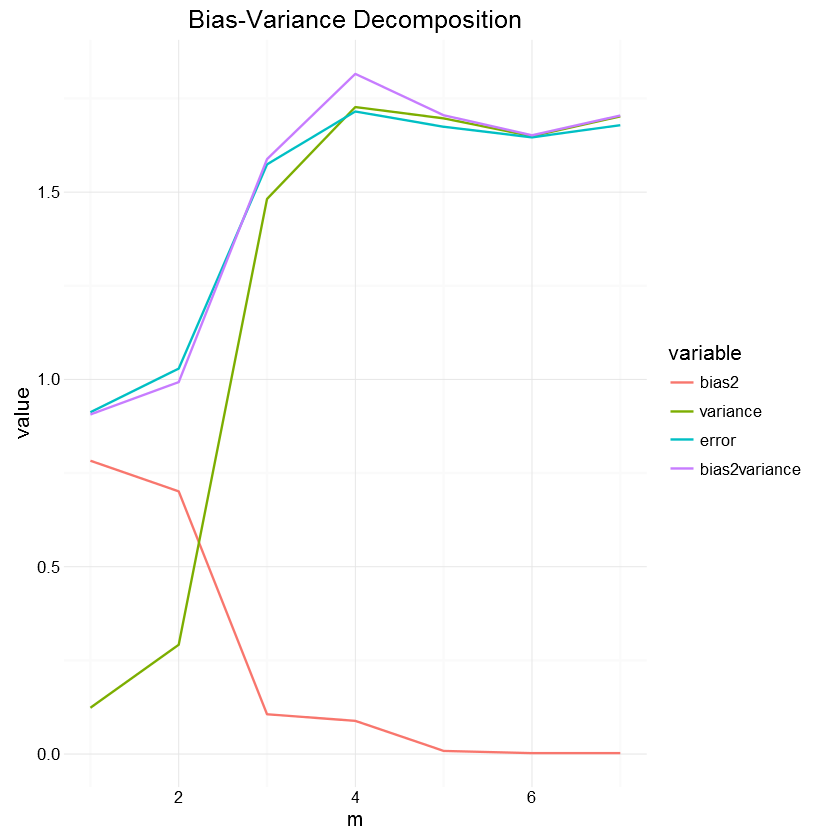

In [8]:
library(ggplot2)
library(reshape2)
dat <- as.data.frame(cbind(1:M, bias2=bias2, variance, error, bias2+variance))
names(dat) <- c('m', 'bias2', 'variance', 'error', 'bias2variance')
dat.m <- melt(dat, id='m')
ggplot(data=dat.m, aes(x=m, y=value, color=variable)) + geom_line() + 
        labs(title='Bias-Variance Decomposition') +  theme_minimal()

## Discussions
Study the above figure and answer the following questions:

1- What is the relationship between the ploynomial degree (`m`) and the Bias<sup>2</sup> and Variance?

2- What is the relationship betwenn Bias<sup>2</sup> and Variance values and testing error?

3- How does Bias<sup>2</sup>-Variance Decomposition figure explain the model figures we have produced at the first part of the experiments?